### Notebook for the integration using ```scVI``` and clustering evaluation with ```SCCAF``` for Healthy PBMCs

- **Objective**: Integration of healthy PBMCs from [Cai 2020](https://pubmed.ncbi.nlm.nih.gov/32114394/) and [Yoshida 2021](https://www.nature.com/articles/s41591-021-01329-2). 
- **Developed by**: Mairi McClean
- **Institute of Computational Biology - Computational Health Centre - Helmholtz Munich**
- **v230425**


### Import required modules

In [1]:
import sys
import scvi
import torch
import anndata
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import seaborn as sns
import ipywidgets as ipw

import numpy as np
import pandas as pd
import scanpy as sc
import numpy.random as random


from umap import UMAP
import warnings; warnings.simplefilter('ignore')

Global seed set to 0
/Users/mairi.mcclean/mambaforge/envs/scvi_sccaf_py39/lib/python3.9/site-packages/flax/struct.py:132: FutureWarning: jax.tree_util.register_keypaths is deprecated, and will be removed in a future release. Please use `register_pytree_with_keys()` instead.
  jax.tree_util.register_keypaths(data_clz, keypaths)
/Users/mairi.mcclean/mambaforge/envs/scvi_sccaf_py39/lib/python3.9/site-packages/flax/struct.py:132: FutureWarning: jax.tree_util.register_keypaths is deprecated, and will be removed in a future release. Please use `register_pytree_with_keys()` instead.
  jax.tree_util.register_keypaths(data_clz, keypaths)
/Users/mairi.mcclean/mambaforge/envs/scvi_sccaf_py39/lib/python3.9/site-packages/flax/struct.py:132: FutureWarning: jax.tree_util.register_keypaths is deprecated, and will be removed in a future release. Please use `register_pytree_with_keys()` instead.
  jax.tree_util.register_keypaths(data_clz, keypaths)


In [2]:
sc.settings.verbosity = 3
sc.logging.print_versions()
sc.settings.set_figure_params(dpi = 160, color_map = 'RdPu', dpi_save = 180, vector_friendly = True, format = 'svg')

-----
anndata     0.9.1
scanpy      1.9.3
-----
PIL                 9.5.0
absl                NA
anyio               NA
appnope             0.1.3
arrow               1.2.3
asttokens           NA
attr                23.1.0
babel               2.12.1
backcall            0.2.0
brotli              NA
certifi             2022.12.07
cffi                1.15.1
charset_normalizer  3.1.0
chex                0.1.7
colorama            0.4.6
comm                0.1.3
contextlib2         NA
cycler              0.10.0
cython_runtime      NA
dateutil            2.8.2
debugpy             1.6.7
decorator           5.1.1
defusedxml          0.7.1
docrep              0.3.2
executing           1.2.0
fastjsonschema      NA
flax                0.6.1
fqdn                NA
fsspec              2023.4.0
gmpy2               2.1.2
h5py                3.8.0
idna                3.4
igraph              0.10.4
importlib_resources NA
ipykernel           6.22.0
ipython_genutils    0.2.0
ipywidgets          8.0.6
isodu

### Read in datasets for integration


- Read in _Cai Y et al 2020_

In [3]:
caiy2020 = sc.read_h5ad('../data/Cai2020_scRNA_PBMC_mm230315_qcd.h5ad')
caiy2020

AnnData object with n_obs × n_vars = 73146 × 61533
    obs: 'study', 'individual', 'sample', 'tissue', 'donor', 'age', 'gender', 'status', 'data_type', 'centre', 'version', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'predicted_doublets'
    var: 'gene_id', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'donor_colors'
    layers: 'counts', 'sqrt_norm'

In [4]:
caiy2020.obs['status'].value_counts()

status
active_TB    33104
Healthy      22049
latent_TB    17993
Name: count, dtype: int64

In [5]:
caiy_healthy = caiy2020[caiy2020.obs['status'].isin(['Healthy'])]
caiy_healthy

View of AnnData object with n_obs × n_vars = 22049 × 61533
    obs: 'study', 'individual', 'sample', 'tissue', 'donor', 'age', 'gender', 'status', 'data_type', 'centre', 'version', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'predicted_doublets'
    var: 'gene_id', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'donor_colors'
    layers: 'counts', 'sqrt_norm'

In [6]:
caiy_healthy.obs['status'].value_counts()

status
Healthy    22049
Name: count, dtype: int64

- Read in _Yoshida et al 2021_

In [7]:
adata_yoshida = sc.read_h5ad('../data/meyer_nikolic_covid_pbmc_raw.h5ad')
adata_yoshida

AnnData object with n_obs × n_vars = 422220 × 33559
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nCount_ADT', 'nFeature_ADT', 'Age_group', 'BMI', 'COVID_severity', 'COVID_status', 'Ethnicity', 'Group', 'Sex', 'Smoker', 'annotation_broad', 'annotation_detailed', 'annotation_detailed_fullNames', 'patient_id', 'sample_id', 'sequencing_library', 'Protein_modality_weight'
    var: 'name'

In [8]:
adata_yoshida.obs['COVID_status'].value_counts()

COVID_status
Healthy          173684
COVID-19         151312
Post-COVID-19     97224
Name: count, dtype: int64

- Subset healthy Yoshida data 

In [9]:
yoshida_healthy = adata_yoshida[adata_yoshida.obs['COVID_status'].isin(['Healthy'])]
yoshida_healthy

View of AnnData object with n_obs × n_vars = 173684 × 33559
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nCount_ADT', 'nFeature_ADT', 'Age_group', 'BMI', 'COVID_severity', 'COVID_status', 'Ethnicity', 'Group', 'Sex', 'Smoker', 'annotation_broad', 'annotation_detailed', 'annotation_detailed_fullNames', 'patient_id', 'sample_id', 'sequencing_library', 'Protein_modality_weight'
    var: 'name'

In [10]:
yoshida_healthy.obs['COVID_status'].value_counts()

COVID_status
Healthy    173684
Name: count, dtype: int64

In [11]:
yoshida_healthy.obs

,orig.ident,nCount_RNA,nFeature_RNA,nCount_ADT,nFeature_ADT,Age_group,BMI,COVID_severity,COVID_status,Ethnicity,Group,Sex,Smoker,annotation_broad,annotation_detailed,annotation_detailed_fullNames,patient_id,sample_id,sequencing_library,Protein_modality_weight
index,,,,,,,,,,,,,,,,,,,,
CV001_KM10202384-CV001_KM10202394_AAACCTGAGGCAGGTT-1,CV001_KM10202384-CV001_KM10202394,5493.0,1767,5297.0,184,Adult,Unknown,Healthy,Healthy,EUR,Adult,Female,Non-smoker,Monocyte,Monocyte CD14,Classical monocyte,AN5,AN5,CV001_KM10202384-CV001_KM10202394,0.359517
CV001_KM10202384-CV001_KM10202394_AAACCTGAGTGTCCCG-1,CV001_KM10202384-CV001_KM10202394,4868.0,1577,2169.0,165,Adult,Unknown,Healthy,Healthy,EUR,Adult,Female,Non-smoker,T CD4+,T CD4 helper,T CD4 helper,AN5,AN5,CV001_KM10202384-CV001_KM10202394,0.577522
CV001_KM10202384-CV001_KM10202394_AAACCTGCAGATGGGT-1,CV001_KM10202384-CV001_KM10202394,3178.0,1257,1330.0,163,Adult,Unknown,Healthy,Healthy,EUR,Adult,Male,Non-smoker,T CD4+,T CD4 helper,T CD4 helper,AN3,AN3,CV001_KM10202384-CV001_KM10202394,0.369143
CV001_KM10202384-CV001_KM10202394_AAACCTGGTATAGTAG-1,CV001_KM10202384-CV001_KM10202394,4745.0,1477,1255.0,161,Adult,Unknown,Healthy,Healthy,EUR,Adult,Female,Non-smoker,T CD8+,T CD8 naive,T CD8 naive,AN5,AN5,CV001_KM10202384-CV001_KM10202394,0.785563
CV001_KM10202384-CV001_KM10202394_AAACCTGGTGTGCGTC-1,CV001_KM10202384-CV001_KM10202394,1902.0,954,1711.0,166,Adult,Unknown,Healthy,Healthy,EUR,Adult,Female,Non-smoker,T CD4+,T CD4 naive,T CD4 naive,AN5,AN5,CV001_KM10202384-CV001_KM10202394,0.564174
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CV001_KM9166642-CV001_KM9166650_TTTGTCAGTCGCATCG-1,CV001_KM9166642-CV001_KM9166650,3513.0,1297,513.0,137,Adolescent,24.7,Healthy,Healthy,EUR,Paediatric,Male,Non-smoker,T CD8+,T CD8 naive,T CD8 naive,NP32,NP32,CV001_KM9166642-CV001_KM9166650,0.343914
CV001_KM9166642-CV001_KM9166650_TTTGTCAGTGTAAGTA-1,CV001_KM9166642-CV001_KM9166650,1888.0,1296,631.0,145,Adolescent,24.7,Healthy,Healthy,EUR,Paediatric,Male,Non-smoker,NK,NK IFN stim,NK IFN stim,NP32,NP32,CV001_KM9166642-CV001_KM9166650,0.264285
CV001_KM9166642-CV001_KM9166650_TTTGTCATCATGTCCC-1,CV001_KM9166642-CV001_KM9166650,1798.0,814,2227.0,169,Child,18.2,Healthy,Healthy,AFR,Paediatric,Male,Non-smoker,Monocyte,Monocyte CD14,Classical monocyte,NP31,NP31,CV001_KM9166642-CV001_KM9166650,0.353094


In [12]:
yoshida_healthy.obs['patient_id'].value_counts()

patient_id
NP18    9799
NP13    8945
AN13    8244
NP23    8038
NP24    7376
AN12    7219
AN7     7105
NP19    7050
NP28    6894
NP17    6377
NP39    6115
AN2     5973
NP44    5906
NP36    5891
NP22    5535
NP27    5300
NP31    5029
NP21    4833
NP37    4654
AN6     4296
AN9     4150
AN5     3943
NP30    3916
NP41    3898
NP32    3778
NP15    3701
NP26    3539
NP20    3374
NP38    3218
AN14    2260
NP16    1851
AN11    1847
NP35    1674
AN3     1041
AN1      915
Name: count, dtype: int64

In [13]:
yoshida_healthy.obs['sample_id'].value_counts()

sample_id
NP18    9799
NP13    8945
AN13    8244
NP23    8038
NP24    7376
AN12    7219
AN7     7105
NP19    7050
NP28    6894
NP17    6377
NP39    6115
AN2     5973
NP44    5906
NP36    5891
NP22    5535
NP27    5300
NP31    5029
NP21    4833
NP37    4654
AN6     4296
AN9     4150
AN5     3943
NP30    3916
NP41    3898
NP32    3778
NP15    3701
NP26    3539
NP20    3374
NP38    3218
AN14    2260
NP16    1851
AN11    1847
NP35    1674
AN3     1041
AN1      915
Name: count, dtype: int64

- Rename shared column headers 
> so that subsequent object concatenation is easier

In [14]:
yoshida_healthy.obs.rename(columns={"patient_id": "donor"}, inplace=True)
yoshida_healthy.obs.rename(columns={"COVID_status": "status"}, inplace=True)
yoshida_healthy.obs.rename(columns={"Sex": "gender"}, inplace=True)
yoshida_healthy.obs.rename(columns={"Age_group": "age"}, inplace=True)
yoshida_healthy.obs['tissue'] = 'PBMC'
yoshida_healthy.obs

,orig.ident,nCount_RNA,nFeature_RNA,nCount_ADT,nFeature_ADT,age,BMI,COVID_severity,status,Ethnicity,...,gender,Smoker,annotation_broad,annotation_detailed,annotation_detailed_fullNames,donor,sample_id,sequencing_library,Protein_modality_weight,tissue
index,,,,,,,,,,,,,,,,,,,,,
CV001_KM10202384-CV001_KM10202394_AAACCTGAGGCAGGTT-1,CV001_KM10202384-CV001_KM10202394,5493.0,1767,5297.0,184,Adult,Unknown,Healthy,Healthy,EUR,...,Female,Non-smoker,Monocyte,Monocyte CD14,Classical monocyte,AN5,AN5,CV001_KM10202384-CV001_KM10202394,0.359517,PBMC
CV001_KM10202384-CV001_KM10202394_AAACCTGAGTGTCCCG-1,CV001_KM10202384-CV001_KM10202394,4868.0,1577,2169.0,165,Adult,Unknown,Healthy,Healthy,EUR,...,Female,Non-smoker,T CD4+,T CD4 helper,T CD4 helper,AN5,AN5,CV001_KM10202384-CV001_KM10202394,0.577522,PBMC
CV001_KM10202384-CV001_KM10202394_AAACCTGCAGATGGGT-1,CV001_KM10202384-CV001_KM10202394,3178.0,1257,1330.0,163,Adult,Unknown,Healthy,Healthy,EUR,...,Male,Non-smoker,T CD4+,T CD4 helper,T CD4 helper,AN3,AN3,CV001_KM10202384-CV001_KM10202394,0.369143,PBMC
CV001_KM10202384-CV001_KM10202394_AAACCTGGTATAGTAG-1,CV001_KM10202384-CV001_KM10202394,4745.0,1477,1255.0,161,Adult,Unknown,Healthy,Healthy,EUR,...,Female,Non-smoker,T CD8+,T CD8 naive,T CD8 naive,AN5,AN5,CV001_KM10202384-CV001_KM10202394,0.785563,PBMC
CV001_KM10202384-CV001_KM10202394_AAACCTGGTGTGCGTC-1,CV001_KM10202384-CV001_KM10202394,1902.0,954,1711.0,166,Adult,Unknown,Healthy,Healthy,EUR,...,Female,Non-smoker,T CD4+,T CD4 naive,T CD4 naive,AN5,AN5,CV001_KM10202384-CV001_KM10202394,0.564174,PBMC
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CV001_KM9166642-CV001_KM9166650_TTTGTCAGTCGCATCG-1,CV001_KM9166642-CV001_KM9166650,3513.0,1297,513.0,137,Adolescent,24.7,Healthy,Healthy,EUR,...,Male,Non-smoker,T CD8+,T CD8 naive,T CD8 naive,NP32,NP32,CV001_KM9166642-CV001_KM9166650,0.343914,PBMC
CV001_KM9166642-CV001_KM9166650_TTTGTCAGTGTAAGTA-1,CV001_KM9166642-CV001_KM9166650,1888.0,1296,631.0,145,Adolescent,24.7,Healthy,Healthy,EUR,...,Male,Non-smoker,NK,NK IFN stim,NK IFN stim,NP32,NP32,CV001_KM9166642-CV001_KM9166650,0.264285,PBMC
CV001_KM9166642-CV001_KM9166650_TTTGTCATCATGTCCC-1,CV001_KM9166642-CV001_KM9166650,1798.0,814,2227.0,169,Child,18.2,Healthy,Healthy,AFR,...,Male,Non-smoker,Monocyte,Monocyte CD14,Classical monocyte,NP31,NP31,CV001_KM9166642-CV001_KM9166650,0.353094,PBMC


- Merge _Cai_ and _Yoshida_ data

In [17]:
adata_healthy = caiy_healthy.concatenate(yoshida_healthy, batch_key = 'dataset', batch_categories = ['caiy2020', 'yoshida2021'], join = 'inner')
adata_healthy

AnnData object with n_obs × n_vars = 195733 × 22792
    obs: 'study', 'individual', 'sample', 'tissue', 'donor', 'age', 'gender', 'status', 'data_type', 'centre', 'version', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'predicted_doublets', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nCount_ADT', 'nFeature_ADT', 'BMI', 'COVID_severity', 'Ethnicity', 'Group', 'Smoker', 'annotation_broad', 'annotation_detailed', 'annotation_detailed_fullNames', 'sample_id', 'sequencing_library', 'Protein_modality_weight', 'dataset'
    var: 'gene_id-caiy2020', 'mt-caiy2020', 'ribo-caiy2020', 'n_cells_by_counts-caiy2020', 'mean_counts-caiy2020', 'pct_dropout_by_counts-caiy2020', 'total_counts-caiy2020', 'name-yoshida2021'

- Remove unrequired columns

In [19]:
adata_healthy.obs = adata_healthy.obs.drop(columns=['age', 'gender', 'data_type', 'centre', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score'])

In [20]:
adata_healthy.obs = adata_healthy.obs.drop(columns= ['version', 'batch', 'Ethnicity', 'Group', 'sequencing_library', 'Protein_modality_weight', 
'individual', 'sample', 'COVID_severity', 'Smoker', 'BMI', 'nFeature_ADT', 'nCount_ADT', 'nFeature_RNA', 'nCount_RNA', 'orig.ident', 
'G2M_score', 'predicted_doublets', 'total_counts_mt', 'total_counts', 'n_genes_by_counts', 'n_genes'])

In [21]:
adata_healthy.obs['study'] = adata_healthy.obs['study'].cat.add_categories("Yoshida_2021").fillna("Yoshida_2021")

In [22]:
adata_healthy.obs

,study,tissue,donor,status,annotation_broad,annotation_detailed,annotation_detailed_fullNames,sample_id,dataset
AAACCTGAGATGGCGT-H2-caiy2020,CaiY_2021,PBMC,SAMN14048020,Healthy,NaN,NaN,NaN,NaN,caiy2020
AAACCTGAGATGTGTA-H2-caiy2020,CaiY_2021,PBMC,SAMN14048020,Healthy,NaN,NaN,NaN,NaN,caiy2020
AAACCTGAGCAACGGT-H2-caiy2020,CaiY_2021,PBMC,SAMN14048020,Healthy,NaN,NaN,NaN,NaN,caiy2020
AAACCTGAGCCATCGC-H2-caiy2020,CaiY_2021,PBMC,SAMN14048020,Healthy,NaN,NaN,NaN,NaN,caiy2020
AAACCTGAGGTGATTA-H2-caiy2020,CaiY_2021,PBMC,SAMN14048020,Healthy,NaN,NaN,NaN,NaN,caiy2020
...,...,...,...,...,...,...,...,...,...
CV001_KM9166642-CV001_KM9166650_TTTGTCAGTCGCATCG-1-yoshida2021,Yoshida_2021,PBMC,NP32,Healthy,T CD8+,T CD8 naive,T CD8 naive,NP32,yoshida2021
CV001_KM9166642-CV001_KM9166650_TTTGTCAGTGTAAGTA-1-yoshida2021,Yoshida_2021,PBMC,NP32,Healthy,NK,NK IFN stim,NK IFN stim,NP32,yoshida2021
CV001_KM9166642-CV001_KM9166650_TTTGTCATCATGTCCC-1-yoshida2021,Yoshida_2021,PBMC,NP31,Healthy,Monocyte,Monocyte CD14,Classical monocyte,NP31,yoshida2021
CV001_KM9166642-CV001_KM9166650_TTTGTCATCGAGGTAG-1-yoshida2021,Yoshida_2021,PBMC,NP31,Healthy,T CD8+,T CD8 naive,T CD8 naive,NP31,yoshida2021


### Harmonized dataset labels

- Check 'tissue' label is unanimous in both datasets

In [23]:
adata_healthy.obs['tissue'].value_counts()

tissue
PBMC    195733
Name: count, dtype: int64

In [24]:
# Check donor
adata_healthy.obs['donor'].value_counts()

donor
SAMN14048019    11275
SAMN14048020    10774
NP18             9799
NP13             8945
AN13             8244
NP23             8038
NP24             7376
AN12             7219
AN7              7105
NP19             7050
NP28             6894
NP17             6377
NP39             6115
AN2              5973
NP44             5906
NP36             5891
NP22             5535
NP27             5300
NP31             5029
NP21             4833
NP37             4654
AN6              4296
AN9              4150
AN5              3943
NP30             3916
NP41             3898
NP32             3778
NP15             3701
NP26             3539
NP20             3374
NP38             3218
AN14             2260
NP16             1851
AN11             1847
NP35             1674
AN3              1041
AN1               915
Name: count, dtype: int64

### Calculate HVGs

In [25]:
adata_raw = adata_healthy.copy()
adata_healthy.layers['counts'] = adata_healthy.X.copy()

In [26]:
sc.pp.highly_variable_genes(adata_healthy,
    flavor = "seurat_v3", 
    n_top_genes = 3000, 
    layer = "counts", 
    batch_key = "donor", 
    subset = True
)

adata_healthy

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


AnnData object with n_obs × n_vars = 195733 × 3000
    obs: 'study', 'tissue', 'donor', 'status', 'annotation_broad', 'annotation_detailed', 'annotation_detailed_fullNames', 'sample_id', 'dataset'
    var: 'gene_id-caiy2020', 'mt-caiy2020', 'ribo-caiy2020', 'n_cells_by_counts-caiy2020', 'mean_counts-caiy2020', 'pct_dropout_by_counts-caiy2020', 'total_counts-caiy2020', 'name-yoshida2021', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'hvg'
    layers: 'counts'

#### Remove unrequired variables prior to model run
- In order to improve size of notebook

In [27]:
del caiy2020
del adata_yoshida

### Integration with scVI


- Batch effect UMAP diagnostics

computing neighbors


OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:20:48)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:02:16)


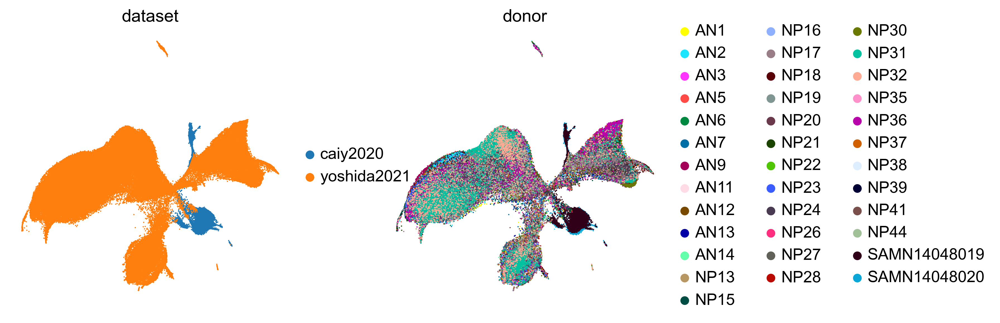

In [31]:
sc.pp.neighbors(adata_healthy, n_neighbors=50, use_rep='X', random_state=30, metric = 'minkowski')
sc.tl.umap(adata_healthy, min_dist = 0.3, spread = 1, random_state = 30)
sc.pl.umap(
    adata_healthy,
    color=["dataset", "donor"],
    frameon=False,
    ncols=4,
    size=4
)


In [32]:
scvi.model.SCVI.setup_anndata(adata_healthy, layer="counts", batch_key="donor")

In [33]:
vae = scvi.model.SCVI(adata_healthy, n_layers=3, n_latent=50, gene_likelihood="nb", dispersion="gene-batch")

In [34]:
scvi.model.SCVI.view_anndata_setup(vae)

Anndata setup with scvi-tools version 0.20.3.

Setup via `SCVI.setup_anndata` with arguments:

{
│   'layer': 'counts',
│   'batch_key': 'donor',
│   'labels_key': None,
│   'size_factor_key': None,
│   'categorical_covariate_keys': None,
│   'continuous_covariate_keys': None
}

         Summary Statistics          
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┓
┃     Summary Stat Key     ┃ Value  ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━┩
│         n_batch          │   37   │
│         n_cells          │ 195733 │
│ n_extra_categorical_covs │   0    │
│ n_extra_continuous_covs  │   0    │
│         n_labels         │   1    │
│          n_vars          │  3000  │
└──────────────────────────┴────────┘

               Data Registry                
┏━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Registry Key ┃    scvi-tools Location    ┃
┡━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│      X       │  adata.layers['counts']   │
│    batch     │ adata.obs['_scvi_batch']  │
│    labels    │ adata.obs['_scvi_labels'] │
└──────────────┴───────────────────────────┘

                   batch State Registry                    
┏━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃  Source Location   ┃  Categories  ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['donor'] │     AN1      │          0          │
│                    │     AN2      │          1          │
│                    │     AN3      │          2          │
│                    │     AN5      │          3          │
│                    │     AN6      │          4          │
│                    │     AN7      │          5          │
│                    │     AN9      │          6          │
│                    │     AN11     │          7          │
│                    │     AN12     │          8          │
│                    │     AN13     │          9          │
│                    │     AN14     │         10          │
│                    │     NP13     │         11          │
│                    │     NP15     │         12          │
│                    │     NP16     │         13          │
│                    │     NP17     │         14          │
│                    │     NP18     │         15          │
│                    │     NP19     │         16          │
│                    │     NP20     │         17          │
│                    │     NP21     │         18          │
│                    │     NP22     │         19          │
│                    │     NP23     │         20          │
│                    │     NP24     │         21          │
│                    │     NP26     │         22          │
│                    │     NP27     │         23          │
│                    │     NP28     │         24          │
│                    │     NP30     │         25          │
│                    │     NP31     │         26          │
│                    │     NP32     │         27          │
│                    │     NP35     │         28          │
│                    │     NP36     │         29          │
│                    │     NP37     │         30          │
│                    │     NP38     │         31          │
│                    │     NP39     │         32          │
│                    │     NP41     │         33          │
│                    │     NP44     │         34          │
│                    │ SAMN14048019 │         35          │
│                    │ SAMN14048020 │         36          │
└────────────────────┴──────────────┴─────────────────────┘

                     labels State Registry                      
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃      Source Location      ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['_scvi_labels'] │     0      │          0          │
└───────────────────────────┴────────────┴─────────────────────┘

In [35]:
vae.train()

GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 41/41: 100%|██████████| 41/41 [48:29<00:00, 71.71s/it, loss=986, v_num=1]     

`Trainer.fit` stopped: `max_epochs=41` reached.


Epoch 41/41: 100%|██████████| 41/41 [48:29<00:00, 70.96s/it, loss=986, v_num=1]


In [36]:
adata_healthy.obsm["X_scVI"] = vae.get_latent_representation()

In [37]:
# Add random state command for neighbors and leiden

sc.pp.neighbors(adata_healthy, n_neighbors=50, use_rep="X_scVI", random_state=30, metric = 'minkowski')
sc.tl.umap(adata_healthy, min_dist = 0.3, spread = 1, random_state = 30)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:40)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:02:08)


In [38]:
plt.figure(figsize = (5, 5))


<Figure size 800x800 with 0 Axes>

<Figure size 800x800 with 0 Axes>

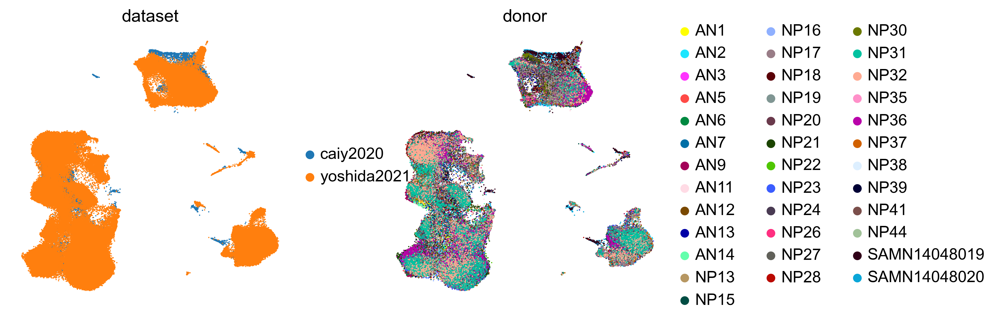

In [39]:
# Variables chosen as they are those shared by both datasets

sc.pl.umap(
    adata_healthy,
    color=["dataset", "donor"],
    frameon=False,
    ncols=4,
    size=4
)


### SCCAF clustering analysis

In [40]:
import SCCAF as sccaf
from SCCAF import SCCAF_assessment, plot_roc

In [41]:
# Resolution on a scale from 0 to 1

sc.tl.leiden(adata_healthy, resolution = 1.0, random_state = 1786)

running Leiden clustering
    finished: found 23 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:01:32)


In [42]:

y_prob, y_pred, y_test, clf, cvsm, acc = SCCAF_assessment(adata_healthy.X, adata_healthy.obs['leiden'], n = 100)



Mean CV accuracy: 0.8761
Accuracy on the training set: 1.0000
Accuracy on the hold-out set: 0.8373


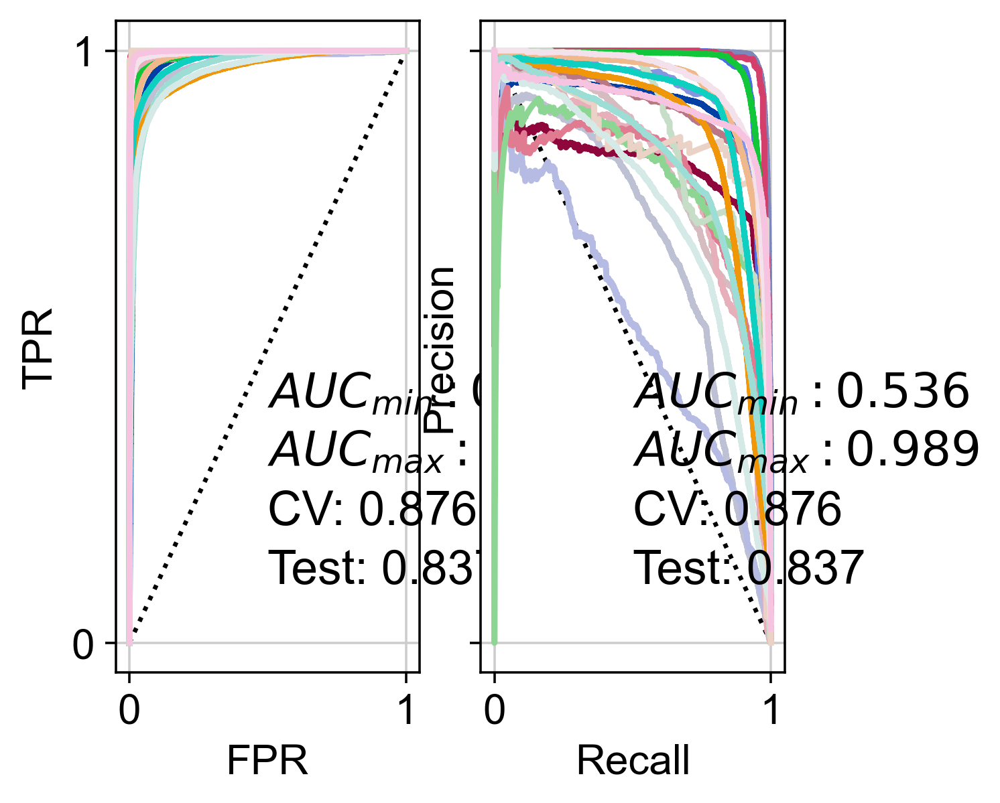

In [43]:
plot_roc(y_prob, y_test, clf, cvsm = cvsm, acc = acc)

plt.show()

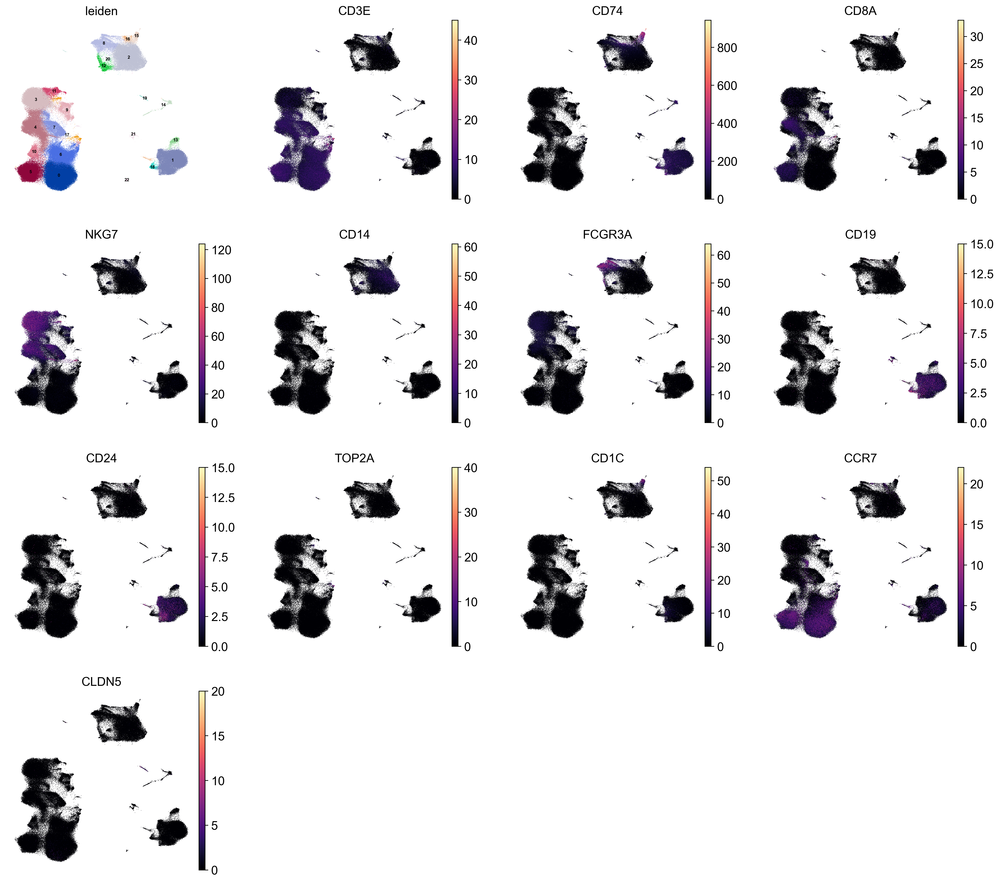

In [44]:
# Markers chosen here are of interest in healthy PBMCs

sc.pl.umap(adata_healthy, frameon = False, color = ['leiden', 'CD3E', 'CD74', 'CD8A', 'NKG7', 'CD14', 'FCGR3A', 
                                                    'CD19',
                                                    'CD24',
                                                    'TOP2A',
                                                    'CD1C',
                                                    'CCR7',
                                                    'CLDN5'], 
                                                    size = 0.8, legend_fontsize = 5, legend_loc = 'on data', color_map="magma")


### Export clustered object

In [45]:
adata_raw


AnnData object with n_obs × n_vars = 195733 × 22792
    obs: 'study', 'tissue', 'donor', 'status', 'annotation_broad', 'annotation_detailed', 'annotation_detailed_fullNames', 'sample_id', 'dataset'
    var: 'gene_id-caiy2020', 'mt-caiy2020', 'ribo-caiy2020', 'n_cells_by_counts-caiy2020', 'mean_counts-caiy2020', 'pct_dropout_by_counts-caiy2020', 'total_counts-caiy2020', 'name-yoshida2021'

In [46]:
adata_healthy

AnnData object with n_obs × n_vars = 195733 × 3000
    obs: 'study', 'tissue', 'donor', 'status', 'annotation_broad', 'annotation_detailed', 'annotation_detailed_fullNames', 'sample_id', 'dataset', '_scvi_batch', '_scvi_labels', 'leiden'
    var: 'gene_id-caiy2020', 'mt-caiy2020', 'ribo-caiy2020', 'n_cells_by_counts-caiy2020', 'mean_counts-caiy2020', 'pct_dropout_by_counts-caiy2020', 'total_counts-caiy2020', 'name-yoshida2021', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'hvg', 'neighbors', 'umap', 'dataset_colors', 'donor_colors', '_scvi_uuid', '_scvi_manager_uuid', 'leiden', 'leiden_colors'
    obsm: 'X_umap', 'X_scVI'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [47]:
# Making a hybrid anndata object using sections from both raw anndata object and the object used for the model
adata_export = anndata.AnnData(X = adata_raw.X, var = adata_raw.var, obs = adata_healthy.obs, uns = adata_healthy.uns, obsm = adata_healthy.obsm, obsp = adata_healthy.obsp)
adata_export

AnnData object with n_obs × n_vars = 195733 × 22792
    obs: 'study', 'tissue', 'donor', 'status', 'annotation_broad', 'annotation_detailed', 'annotation_detailed_fullNames', 'sample_id', 'dataset', '_scvi_batch', '_scvi_labels', 'leiden'
    var: 'gene_id-caiy2020', 'mt-caiy2020', 'ribo-caiy2020', 'n_cells_by_counts-caiy2020', 'mean_counts-caiy2020', 'pct_dropout_by_counts-caiy2020', 'total_counts-caiy2020', 'name-yoshida2021'
    uns: 'hvg', 'neighbors', 'umap', 'dataset_colors', 'donor_colors', '_scvi_uuid', '_scvi_manager_uuid', 'leiden', 'leiden_colors'
    obsm: 'X_umap', 'X_scVI'
    obsp: 'distances', 'connectivities'

In [51]:
adata_export.write('../data/CaiY_Yoshida_healthy_scRNA_PBMC_mm230509_scVI-clustered.raw.h5ad')


### scVI DE exploration

In [49]:
# one vs all, over all groups (Comparison group is cluster 0)
full_de_res = vae.differential_expression(groupby='leiden')
full_de_res.head()

DE...: 100%|██████████| 23/23 [01:23<00:00,  3.65s/it]


,proba_de,proba_not_de,bayes_factor,scale1,scale2,pseudocounts,delta,lfc_mean,lfc_median,lfc_std,...,raw_mean1,raw_mean2,non_zeros_proportion1,non_zeros_proportion2,raw_normalized_mean1,raw_normalized_mean2,is_de_fdr_0.05,comparison,group1,group2
LRRN3,0.9792,0.0208,3.851782,0.000252,0.000051,0.0,0.25,4.723517,5.190322,2.831330,...,0.312584,0.080159,0.210536,0.044916,2.456622,0.518730,True,0 vs Rest,0,Rest
ASIC1,0.9756,0.0244,3.688469,0.000002,0.000001,0.0,0.25,2.736840,3.071148,2.179444,...,0.002599,0.001639,0.002469,0.001335,0.020805,0.011026,True,0 vs Rest,0,Rest
TRBV18,0.9754,0.0246,3.680101,0.000178,0.000042,0.0,0.25,3.336000,3.691381,4.871788,...,0.180001,0.041227,0.042006,0.010033,1.503379,0.306495,True,0 vs Rest,0,Rest
TRBV5-1,0.9754,0.0246,3.680101,0.000329,0.000072,0.0,0.25,3.824756,4.065715,3.988081,...,0.556458,0.129185,0.075834,0.020314,4.535823,0.952536,True,0 vs Rest,0,Rest
TRBV12-4,0.9742,0.0258,3.631242,0.000192,0.000113,0.0,0.25,2.623717,2.994000,6.213124,...,0.181063,0.077926,0.024694,0.011900,1.540783,0.621715,True,0 vs Rest,0,Rest
